In [1]:
%matplotlib notebook
import numpy as np
from matplotlib import pyplot as plt
import torch
from torch import nn
import seaborn as sn

import torchvision
import torchvision.transforms as transforms
from torch.utils import data
from torchvision.utils import make_grid

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# Just DCGAN
 I used implementation described at https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html <br>
Dataset used was constructed from the following: <br>
1) https://www.kaggle.com/datasets/soumikrakshit/anime-faces <br>
2) https://www.kaggle.com/datasets/andy8744/ganyu-genshin-impact-anime-faces-gan-training <br><br>
With face detector some non-face images were deleted (there were many of them in the first set) <br>

I added G's penalty for dark images: <br>
$$\mathcal{L}'_G = \mathcal{L}_G + \mu(|img|),$$ where $\mu$ represents element-wise tensor mean (scalar value) <br>
Some results will be shown below

In [2]:
channels = 3
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d( 100, 64 * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64 * 8, 64 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( 64 * 4, 64 * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( 64 * 2, 64 * 1, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( 64 * 1, channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

# Epoch 0

In [4]:
netG = Generator().to(device)
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


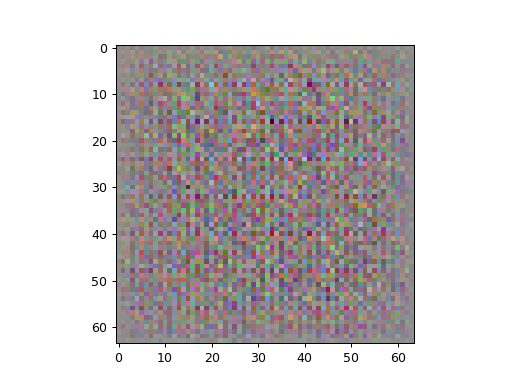

In [5]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [6]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


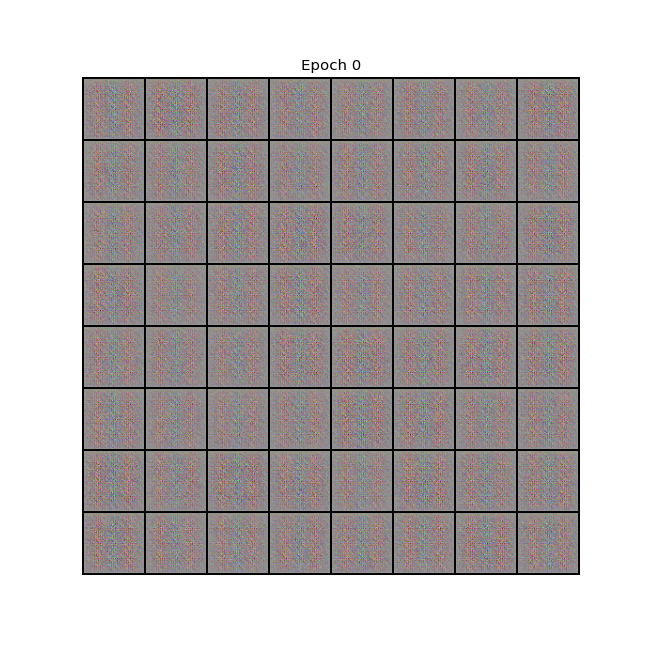

In [8]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 0")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 1

In [467]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_1.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


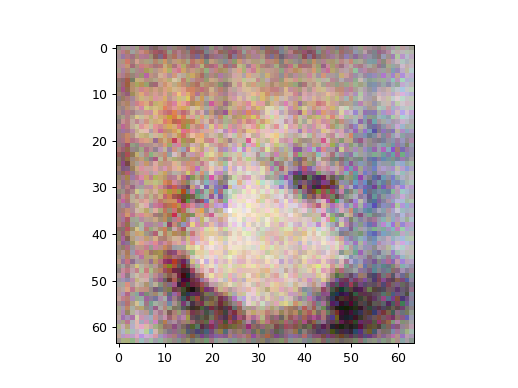

In [469]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [438]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


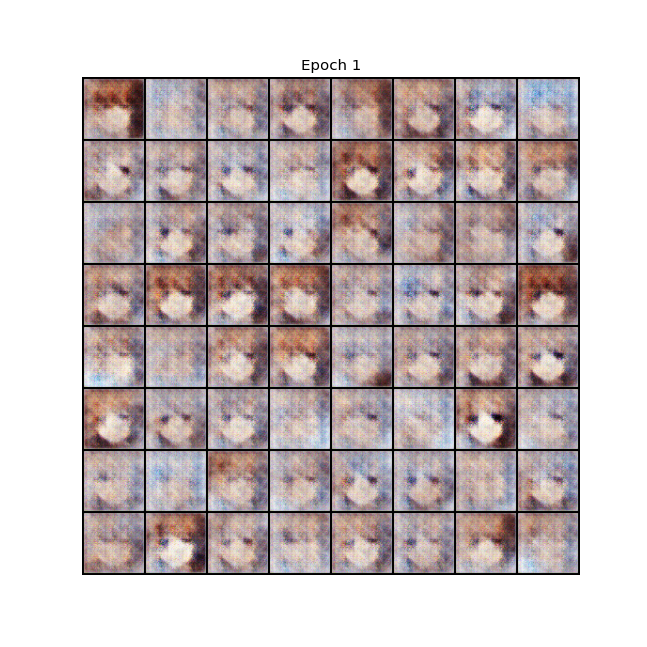

In [440]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 1")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 10

In [444]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_10.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


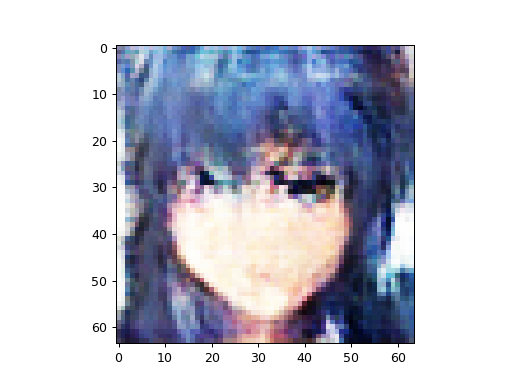

In [465]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [70]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


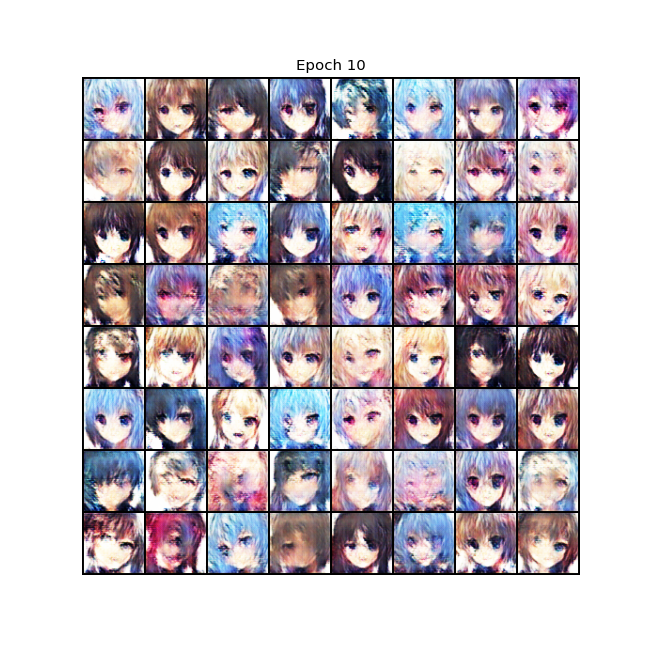

In [71]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 10")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 20

In [194]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_20.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


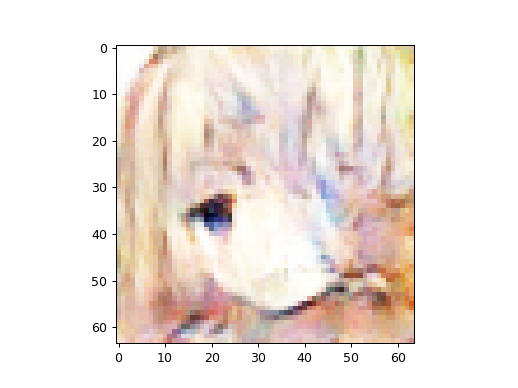

In [199]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [77]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


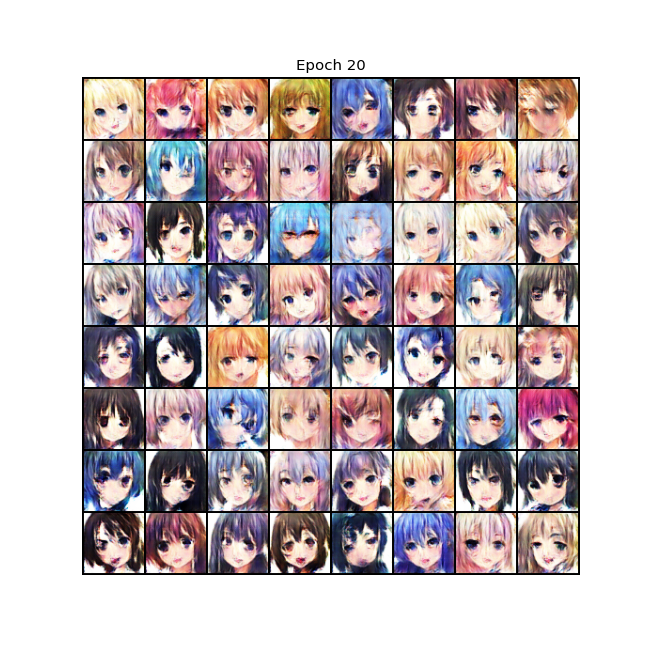

In [78]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 20")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 30

In [79]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_30.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


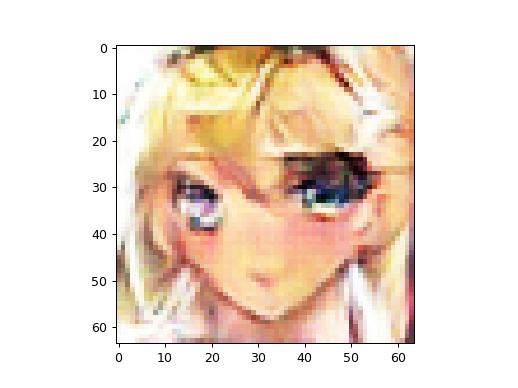

In [110]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [82]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


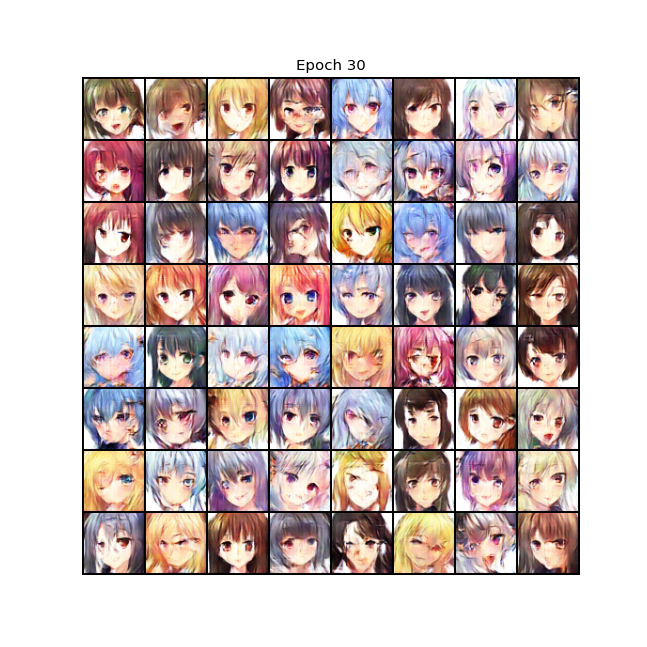

In [83]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 30")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 40

In [111]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_40.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


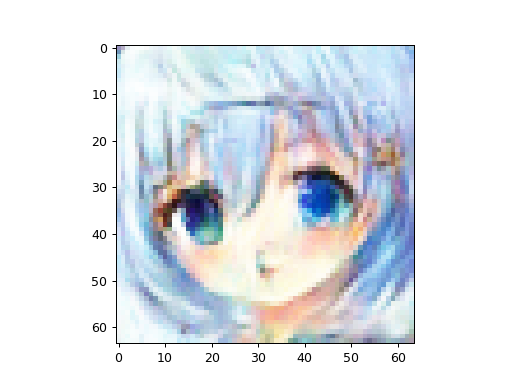

In [193]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [112]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


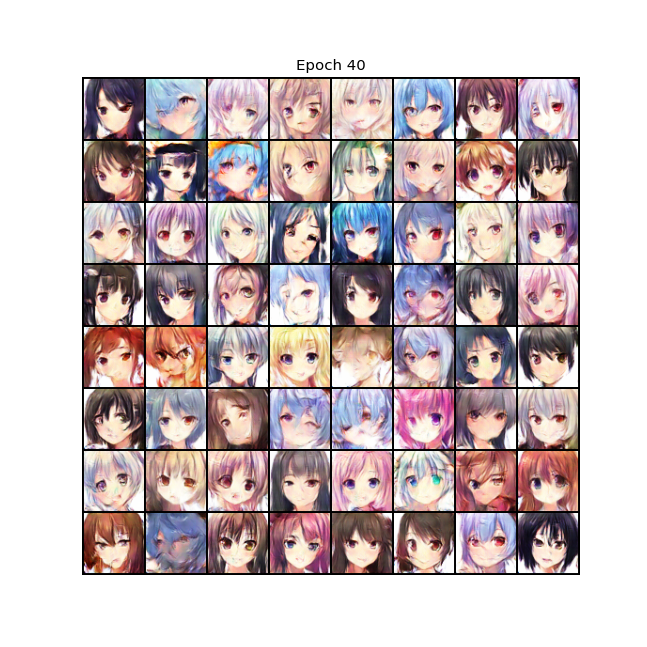

In [113]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 40")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 50

In [141]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_50.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


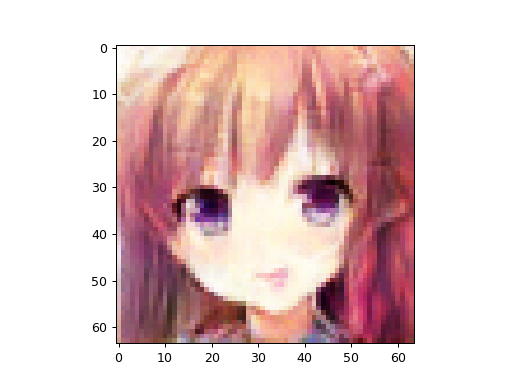

In [140]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [142]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


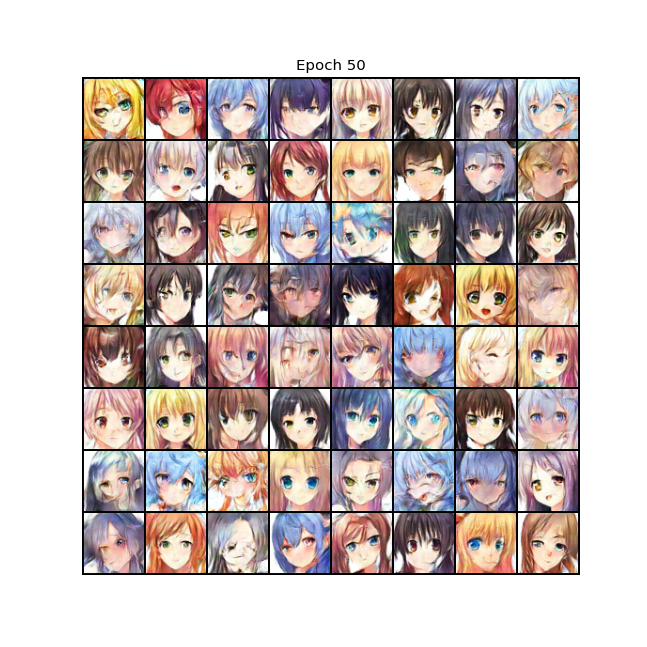

In [143]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 50")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 60

In [472]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_60.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


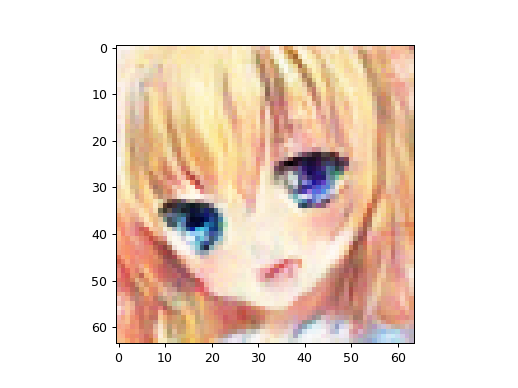

In [534]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [217]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


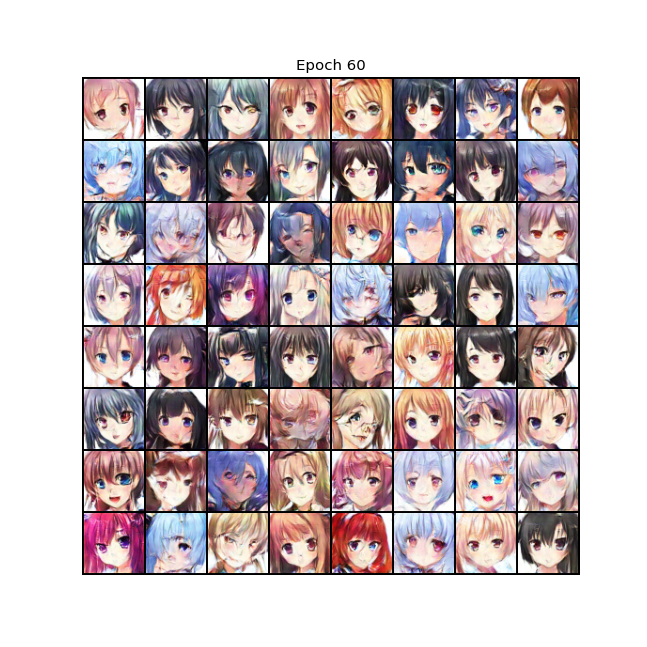

In [218]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 60")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 70 

In [246]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_70.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


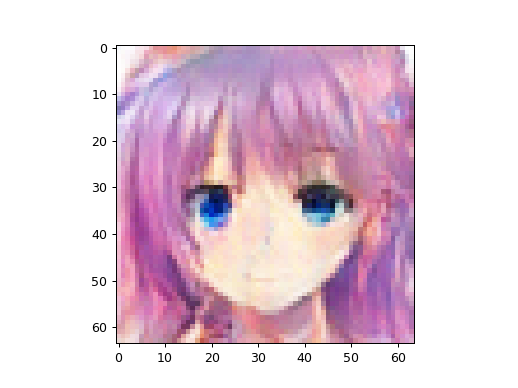

In [266]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [247]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


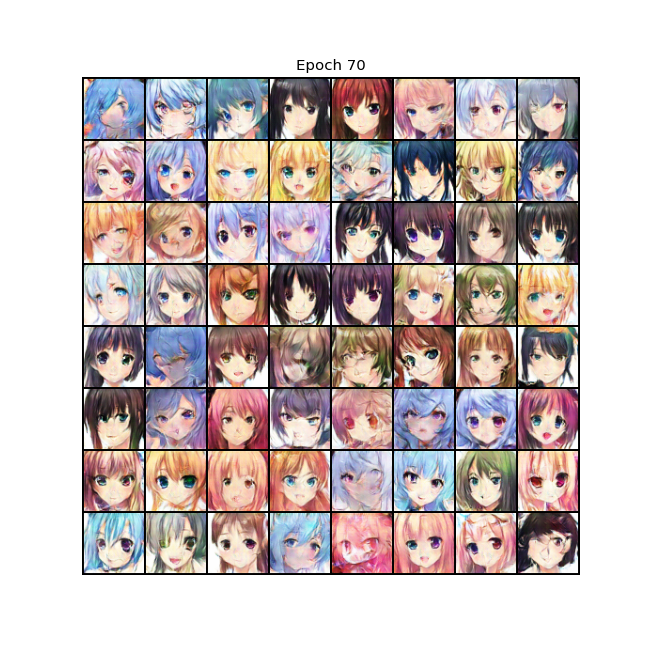

In [248]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 70")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 80

In [267]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_80.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


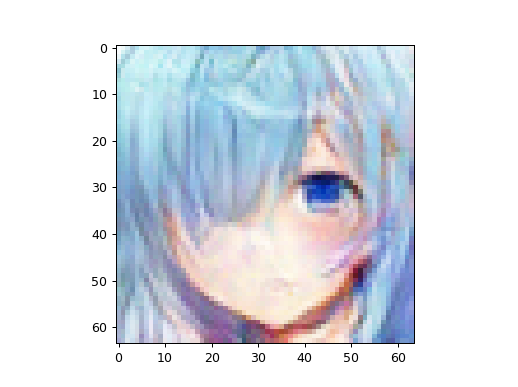

In [297]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [268]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


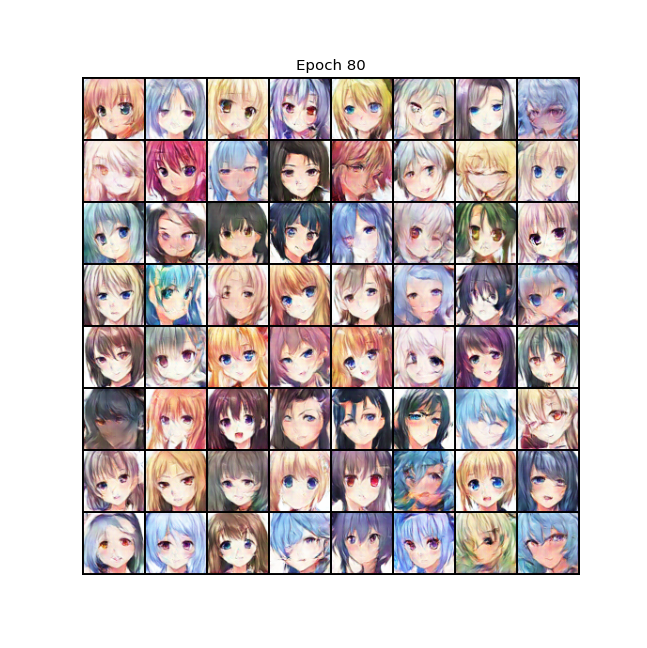

In [269]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 80")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 90

In [298]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_90.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


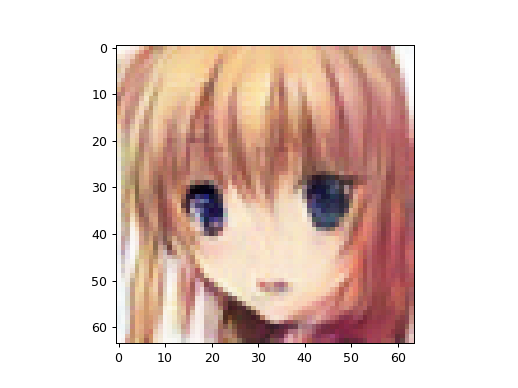

In [326]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [299]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


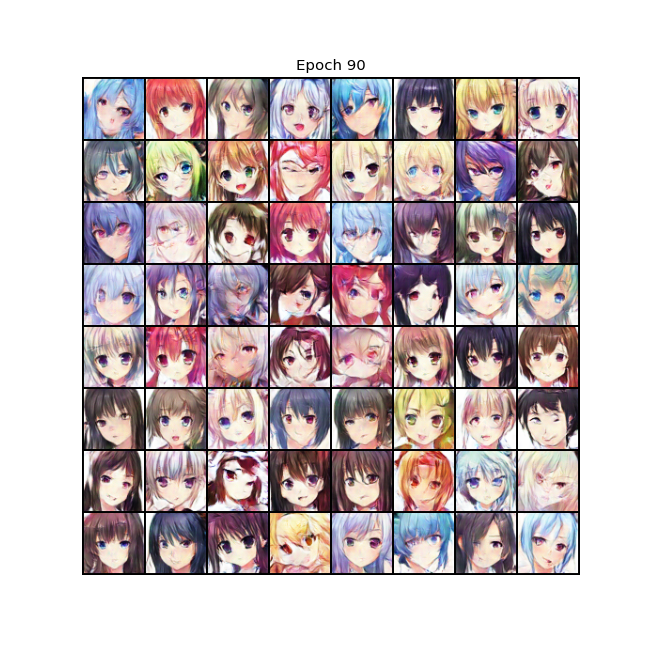

In [300]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 90")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Epoch 100

In [328]:
netG = Generator().to(device)
netG.load_state_dict(torch.load("./models/biggerset_100.pt"))
netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

<IPython.core.display.Javascript object>


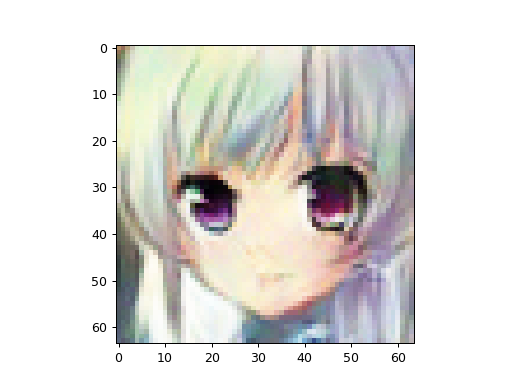

In [436]:
noise = torch.randn(1, 100, 1, 1, device=device)
img = netG(noise)
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device), normalize=True).cpu(),(1,2,0)))

In [329]:
noise = torch.randn(64, 100, 1, 1, device=device)
img = netG(noise)

<IPython.core.display.Javascript object>


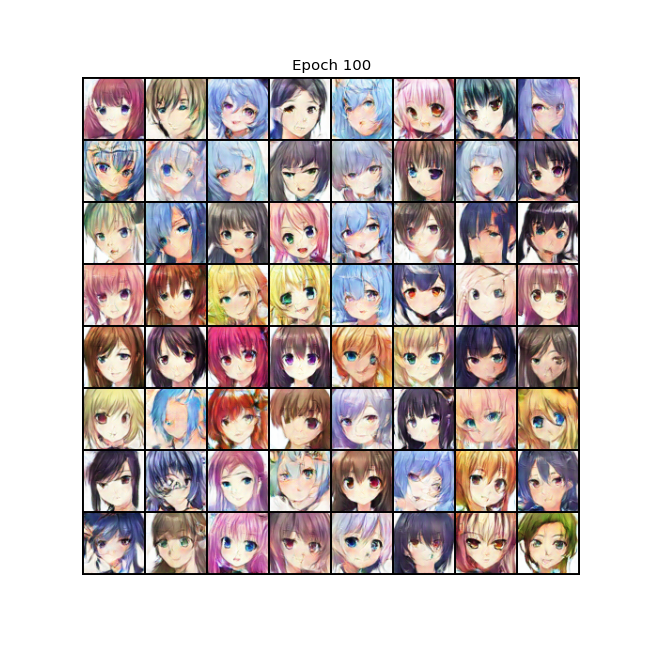

In [330]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Epoch 100")
plt.imshow(np.transpose(torchvision.utils.make_grid(img.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))